In [2]:
import scanpy as sc
import numpy as np
import sctm
import squidpy as sq

%load_ext autoreload
%autoreload 2

/home/chengwei/miniconda3/envs/torch/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In this tutorial, we demonstrate how to analyse multiple tissue slices in horizontal integration. Here we take mouse anterior and posterior brain as example. ST data were downloaded from https://www.10xgenomics.com/. Before inputting the model, alignment algorithm was implemented to align mouse anterior and posterior brain data.

The prepocessed data can be accessible and downloaded via https://drive.google.com/drive/folders/1jDmx8IjiGhOD__spuuhFB1fWVDJtv5CU.

In [3]:
adata = sc.read_h5ad("../../../../spatialLDA/spatiallda/reproducibility/figure1/data/Mouse_Brain_Merge_Anterior_Posterior_Section_2/filtered_feature_bc_matrix.h5ad")
adata.var_names_make_unique()

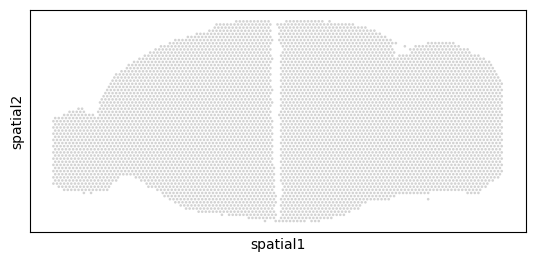

In [4]:
sc.pl.spatial(adata, spot_size = 100)

In [90]:
sc.pp.filter_cells(adata, min_genes=50)
sctm.pp.filter_genes(adata, 0.03,  expression_cutoff_99q = 1)
sc.pp.highly_variable_genes(adata, n_top_genes=6000, flavor="seurat_v3", batch_key = 'data')

In [91]:
sq.gr.spatial_neighbors(adata, library_key = "data")

In [92]:
n_topics = 35
# Only hvgs and fit a total of 40 topics here although that we put 30 in the paper
# 
model = sctm.stamp.STAMP(
    adata[:, adata.var.highly_variable],
    n_topics = n_topics,
    categorical_covariate_keys = ['data']
)

# uses gpu by default to use cpu use device="cpu"
model.train()

Computing background frequencies
tensor(33652104.)
Layer (type:depth-idx)                   Param #
OptimizedModule                          --
├─spatialLDAModel: 1-1                   --
│    └─MLPEncoderMVN: 2-1                --
│    │    └─Dropout: 3-1                 --
│    │    └─BatchNorm1d: 3-2             24,000
│    │    └─BatchNorm1d: 3-3             100
│    │    └─BatchNorm1d: 3-4             --
│    │    └─Linear: 3-5                  1,785
│    │    └─Linear: 3-6                  1,785
│    │    └─Linear: 3-7                  30,345
│    │    └─Linear: 3-8                  600,050
Total params: 658,065
Trainable params: 658,065
Non-trainable params: 0


Loss:6811.355:   0%|          | 1/2000 [00:00<27:10,  1.23it/s]

Loss:5936.756:  28%|██▊       | 564/2000 [07:26<18:56,  1.26it/s]

Early Stopping


In [87]:
model.get_metrics()

{'Topic Coherence': 0.2594730770027048,
 'Topic Diversity': 0.8725,
 'Gene Topic Coherence': 0.27351274098204054}

In [94]:
# Get topic prop which is the latent representation and beta which are the gene modules
topic_prop = model.get_cell_by_topic()
beta = model.get_feature_by_topic()
# Add it into adata to visualize
for i in topic_prop.columns:
    adata.obs[i] = topic_prop[i]

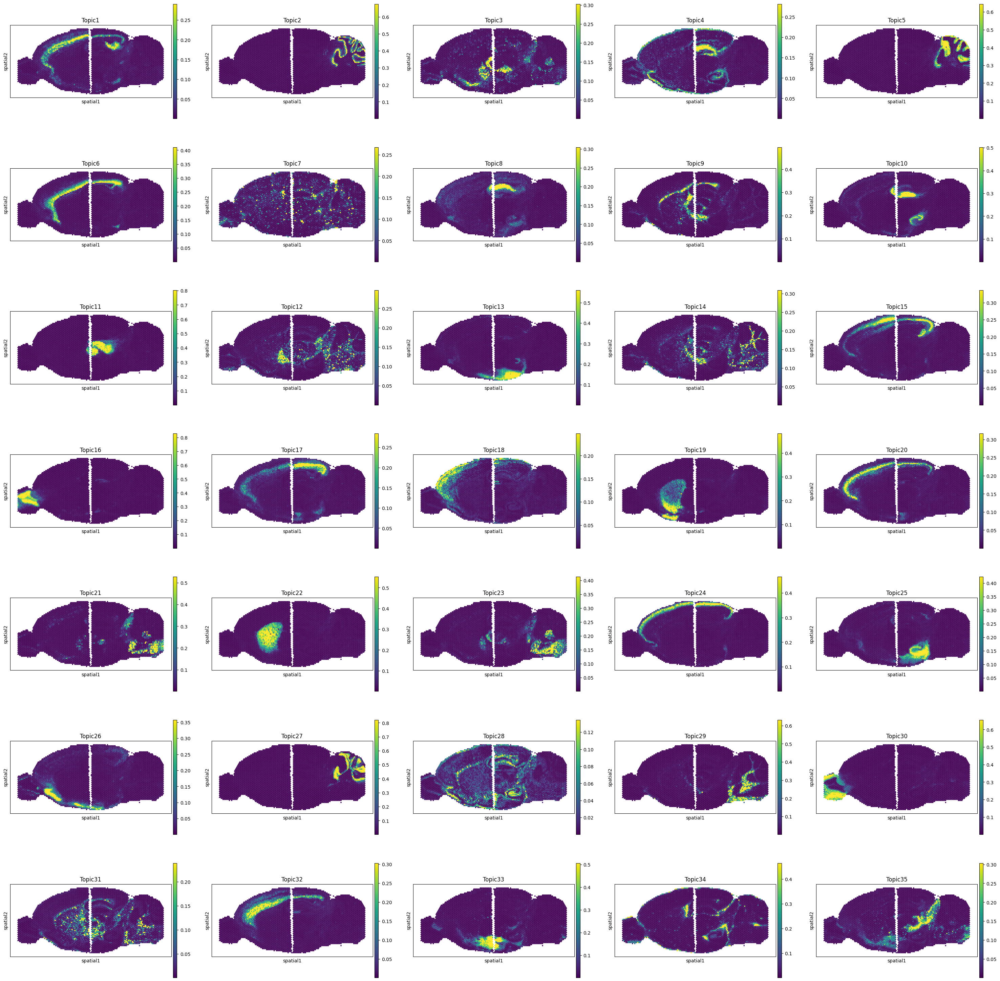

In [99]:
sc.pl.spatial(adata, color = topic_prop.columns, ncols = 5, spot_size = 150, vmax ='p99')

In [97]:
top_genes = []
for i in topic_prop.columns:
    top_genes += beta.nlargest(1, i).index.tolist()

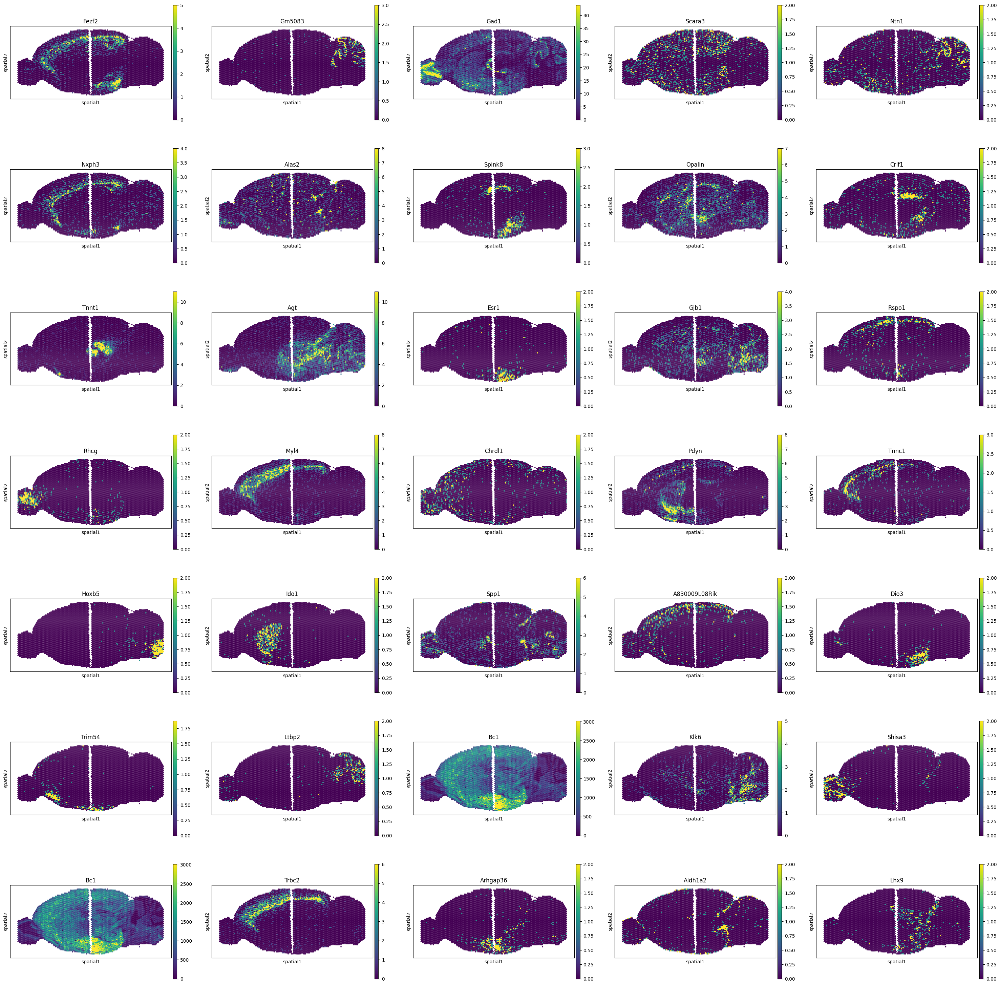

In [98]:
sc.pl.spatial(adata, color = top_genes, ncols = 5, spot_size = 150, vmax ='p99')

Plot out the different layers

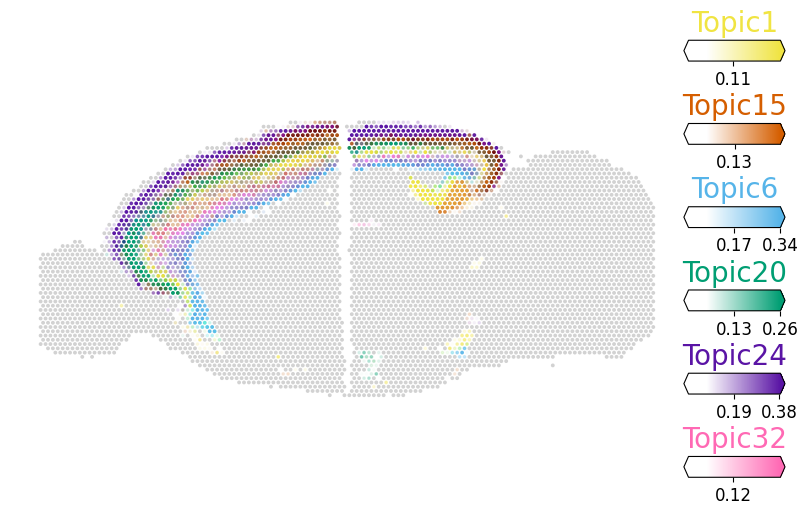

In [114]:
topics = ["Topic1", "Topic15", "Topic6", "Topic20", "Topic24", "Topic32"]
fig = sctm.pl.plot_spatial(adata, topic_prop.loc[:, topics], spot_size = 7,  display_zeros = True, axis_y_flipped = True)